In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import ssam
from IPython.display import display, Image

/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


### Load mRNA spot data:

In [2]:
path = '/data/analysis/ag-ishaque/tiesmeys/placenta/data/'
files =  os.listdir(path)
files_coords = [f for f in files if 'KS_' in f]
files_signs = [f for f in files if 'avgExp' in f]
# file = files[0]
# pd.Series(files_coords)
files_signs,files_coords

file_coords =  'Decoded_102KS_6cycles.csv'
file_signs = 'Early_villi_avgExp_probeList_ISS_updated.csv'

# title = 'raw SSAM output, 102, early placenta'
# prefix = 'ssam_102_'
# bandwidth = 4.5
# min_norm = 0.1
# min_r = 0.05

title = 'smoothed SSAM output, 102, early placenta'
prefix = 'smothed_102_'
bandwidth = 4.5
min_norm = 0.09
min_r = 0.07

hist_file = 'flou_early.png'

xlims = (250,850)
ylims = (200,800)
    

In [3]:
import scanpy as sc
file_signs = '/data/analysis/preeclampsia_2019/spatial_data/ControlV_SCT_Sebastian.h5ad'

adata = sc.read_h5ad(file_signs)
adata_early= adata[adata.obs['group']== 'Early_Villi_C']

exp_mat = pd.DataFrame(columns= adata_early.var_names, index=adata_early.obs['cell_type_semifinal_v2'].cat.categories) 
# exp_mat = pd.read_csv(os.path.join(path,file_signs))
# exp_mat = exp_mat.set_index(exp_mat.keys()[0]).T

# exp_mat = exp_mat.set_index((c.split('.')[1] for c in exp_mat.index))

# for c in adata_late.obs['cell_type_semifinal_v2'].cat.categories: 
#     exp_mat.loc[c] = adata_late[adata_late.obs['cell_type_semifinal_v2'].isin([c]),:].X.mean(0)

counts = []

for c in adata_early.obs['cell_type_semifinal_v2'].cat.categories: 
    counts.append((adata_early.obs['cell_type_semifinal_v2']==c).mean())
    exp_mat.loc[c] = adata_early[adata_early.obs['cell_type_semifinal_v2'].isin([c]),:].X.mean(0)
    
counts = np.array(counts)

In [4]:
exp_mat = exp_mat.astype(float)
exp_mat

index,AL627309.1,AL732372.1,AC114498.1,AL669831.5,LINC00115,FAM41C,SAMD11,NOC2L,KLHL17,PLEKHN1,...,AL162171.1,LINC02317,AC004232.2,AC006238.1,LINC02560,LINC00307,HIST2H2AA4,CYP11B1,AC244452.3,LINC01917
vBcell,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vDC,0.003727,0.000000,0.000000,0.031993,0.000000,0.000000,0.000000,0.024540,0.000000,0.007453,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vEB,0.005000,0.000000,0.000000,0.022471,0.000645,0.000645,0.000000,0.018006,0.005645,0.000645,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vEVT,0.005332,0.000000,0.001066,0.040522,0.001066,0.000000,0.004266,0.023460,0.011730,0.014929,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vFB,0.003239,0.000000,0.003239,0.059099,0.006478,0.000000,0.008098,0.037249,0.018762,0.003239,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vHBC,0.030754,0.000000,0.000000,0.105474,0.000000,0.002366,0.006115,0.040217,0.007097,0.002366,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vMC,0.010231,0.000000,0.000000,0.076105,0.000000,0.002558,0.002558,0.035808,0.012789,0.002558,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vSCT_1,0.007593,0.005716,0.011001,0.033495,0.002764,0.000322,0.000322,0.012453,0.002120,0.000966,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vSCT_2,0.038508,0.000000,0.009627,0.067389,0.009627,0.000000,0.009627,0.063394,0.019254,0.019254,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vTSC,0.004707,0.000000,0.004707,0.043054,0.005884,0.002354,0.000000,0.025402,0.001177,0.024225,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
data = pd.read_csv(os.path.join(path,file_coords))
genes = data.gene.unique()
genes = sorted(genes)

exp_mat['HBA1/2']=exp_mat[['HBA1','HBA2']].mean(1)
# exp_mat['UTY']=0
# exp_mat['XIST']=0
exp_mat=exp_mat[genes]

print((files))

['flou_PE.png', 'Early_villi_avgExp_probeList_ISS_XIST.csv', '102KS_small_without mitochondrial transcripts_Decoded_LowThreshold.csv', 'LateC_villi_avgExp_Katja.csv', 'Decoded_102KS_6cycles.csv', 'LateC_villi_avgExp_Katja_SCT.csv', '105KS_small_Decoded_LowThreshold.csv', 'LateVilli_fraction_KatjaGenes.csv', 'Decoded_106KS_all_genes.csv', 'PE_villi_avgExp_probeList_ISS.csv', 'Early_villi_avgExp_probeList_ISS_updated.csv', 'All_placenta_avgExp_probeList_XIST.csv', 'LateC_villi_avgExp_probeList_ISS_updated.csv', 'Decoded_all_available_genes_3_cycles.csv', '102KS_small_Decoded_LowThreshold.csv', 'Decoded_106KS_all_genes_newest.csv', 'PE_villi_avgExp_probeList_ISS_updated.csv', 'fig1a_main.png', 'flou_PE_all.jpg', 'LateC_villi_avgExp_probeList_ISS_XIST.csv', '106KS_small_Decoded.csv', 'LateC_villi_avgExp_all.csv', 'Early_villi_avgExp_probeList_ISS.csv', 'Decoded_106KS_all_genes_new.csv', 'PE_villi_avgExp_probeList_ISS_XIST.csv', 'Signatures_NegBinom_1503_covars_filtered.csv', 'regression_mo

In [6]:
# scale_factor = 0.1
um_per_px = 0.162
pixel_per_um = 1/um_per_px
height = 0 
width = 0 
 
mrna_loci = []

for gene in genes:
    xs=data[data.gene==gene].X/pixel_per_um
    ys=data[data.gene==gene].Y/pixel_per_um
    height = max(ys.max(),height)
    width = max(xs.max(),width)
    mrna_loci.append(np.vstack([xs,ys]).T)
    
height = int(height+30)
width = int(width+30)

### Create SSAM tissue model:

In [7]:
ds = ssam.SSAMDataset(genes, mrna_loci, width, height)
analysis = ssam.SSAMAnalysis(ds, ncores=30,)
analysis.run_fast_kde(bandwidth=bandwidth, kernel='gaussian',re_run=True, save=False)



83 83 83


### Load scRNA data:

In [8]:
# exp_mat = pd.read_csv(os.path.join(path,file_signs))
# exp_mat = exp_mat.set_index(exp_mat.keys()[0]).T
# exp_mat = exp_mat.set_index((c.split('.')[1] for c in exp_mat.index))

In [9]:
# print([g  for g in genes if not g in exp_mat.keys() ])
# print([g  for g in list(exp_mat.keys()) if not g in genes ])

In [10]:
exp_mat = exp_mat[genes]
clusters = list(exp_mat.index)

In [11]:
# clusters_thematic = ['vBcell', 'vTcell', 'vMC', 
#                      'vVEC', 'vHBC', 'vFB', 
#                      'vDC', 'vEVT', 'vSCT_1','vSCT_2', 'vTSC', 
#                      'vVCT', 'vVCT_prol',]
clusters_thematic = ['vBcell',  'vTcell', 'vEB' ,'vEVT', 'vMC','vDC',  'vFB', 'vHBC', 'vSCT_1',
       'vSCT_2', 'vTSC', 'vVCT', 'vVCT_prol', 'vVEC']
cluster_argsort = np.array([clusters.index(c) for c in clusters_thematic])
# cluster_argsort[cluster_argsort>8]-=1
# clusters_thematic= [c for c in clusters
exp_mat_thematic = exp_mat.iloc[cluster_argsort]

### Assign tissue types using SSAM:

In [12]:
# exp_mat_no_Tcells = exp_mat.copy()
# exp_mat_no_Tcells.iloc[list(clusters).index('vTcell')]=0

analysis.map_celltypes(np.array(exp_mat_thematic))#_no_Tcells))


In [13]:
analysis.filter_celltypemaps(min_norm=min_norm, min_r=min_r)

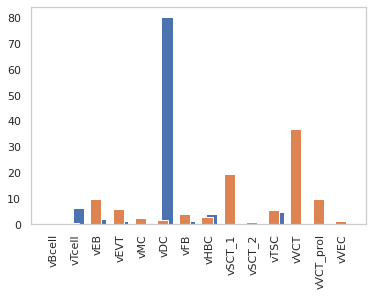

In [14]:

early_count = counts[[clusters.index(c) for c in clusters_thematic]]
early_probs = early_count/early_count.sum()*100 

cnts = [(ds.filtered_celltype_maps==(i)).sum() for i in range(len(clusters_thematic))]
plt.bar(np.arange(len(cnts))+0.1,cnts/sum(cnts)*100,width=0.5)
plt.bar(np.arange(len(cnts))-0.1,early_probs,width=0.5)

plt.xticks(np.arange(len(clusters_thematic)), clusters_thematic, rotation=90)
# plt.yscale('log')
plt.show()

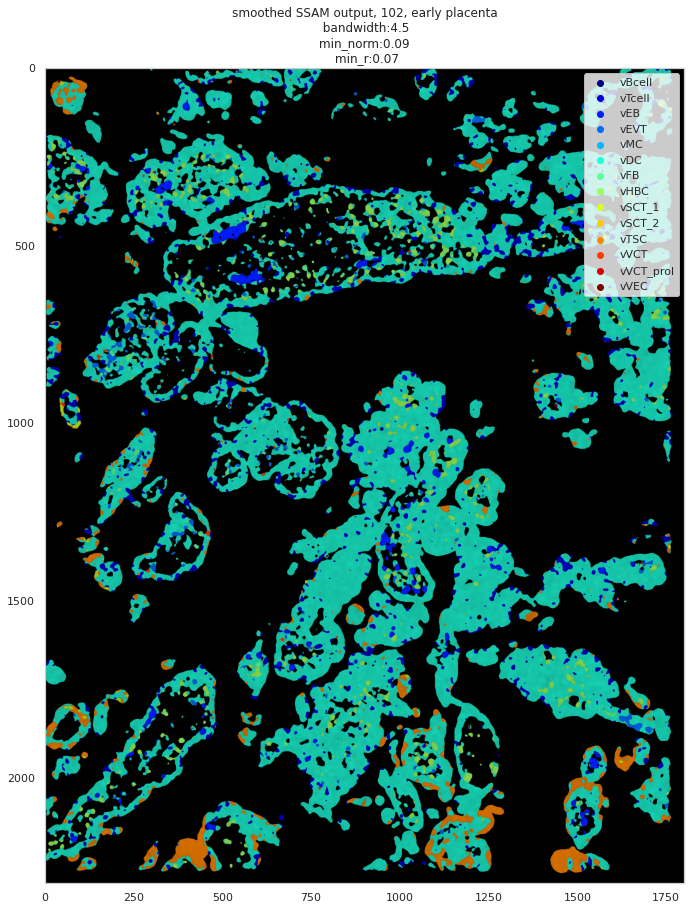

In [15]:
%matplotlib inline

plt.figure(figsize=(15,15))

colors = ds.plot_celltypes_map(rotate=0, set_alpha=True, )

[plt.scatter([],[] , color=c) for c in colors]
plt.title(title+'\n  bandwidth:%s \n min_norm:%s \n min_r:%s'%(bandwidth,min_norm,min_r))

_=plt.legend(labels=clusters_thematic)

plt.savefig(os.path.join(path,'..','output','figures',prefix+'complete_clrs.pdf'))


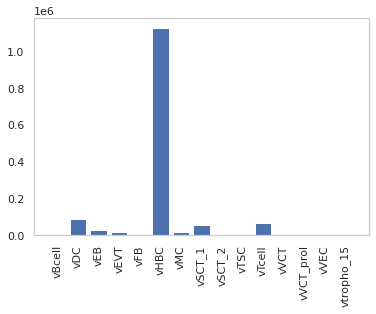

In [16]:
%matplotlib inline
cnts = [(ds.filtered_celltype_maps==i).sum() for i in range(len(clusters))]
plt.bar(np.arange(len(cnts)),cnts)
plt.xticks(np.arange(len(clusters)), clusters, rotation=90)
plt.show()

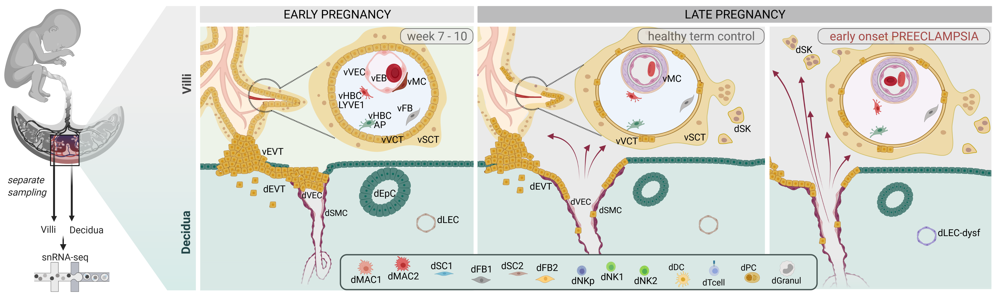

In [17]:
Image(os.path.join(path,'fig1a_main.png'))

|     | Abb | Cell Type | 
| --- | --- | --- | 
| **Fetal Vessels** | vBcell | B cell  |
|| vTcell | T cell  |
|| vMC    | myocyte |
|| vVEC   | Vascular Endothelial cell |
|| vEB    | Erytroblast |
| **Macrophages** |  vHBC   | Hofbauer Cell |
|| vFB    | Fibroblast |
|| vDC/vPAMM    | Dendritic Cell |
|| vEVT   | Extravillous trophoblast |
| **villi 'wall'** | vSCT_1 |  syncytiotrophoblast |
|| vSCT_2 | syncytiotrophoblast  |
|| vTSC   | Trophoblast stem cell |
|| vVCT   | Cytotrophoblast |
|| vVCT_prol   | Cytotrophoblast prolif.|
|| vtropho_15   | Trophoblast 15 |

### Denoise using spatial statistics

In [18]:
import sonar

# cell_matrix = np.array([ds.filtered_celltype_maps==i for i in range(len(clusters))]).squeeze()
cell_matrix = ds.vf.squeeze().transpose([2,0,1])#np.array([ds.filtered_celltype_maps==i for i in range(len(clusters_thematic))]).squeeze()

son = sonar.Sonar()
cm_resized = son.rescale(cell_matrix,0.5)
# cm_resized[:,cm_resized.sum(0)<0.1]=0

Creating ambient maps...


/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/sonar.py:208: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.cell_matrix = torch.tensor(cell_matrix,device=device)



(8, 41, 41)


/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/sonar.py:165: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_sample[:img_shape[0],:img_shape[1]] = torch.tensor(tissue_mask, dtype=torch.float, device=device)



Integrating data...


/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/sonar.py:341: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(torch.tensor(mask).cpu()-(2*(cell_contours>0)),aspect='auto')


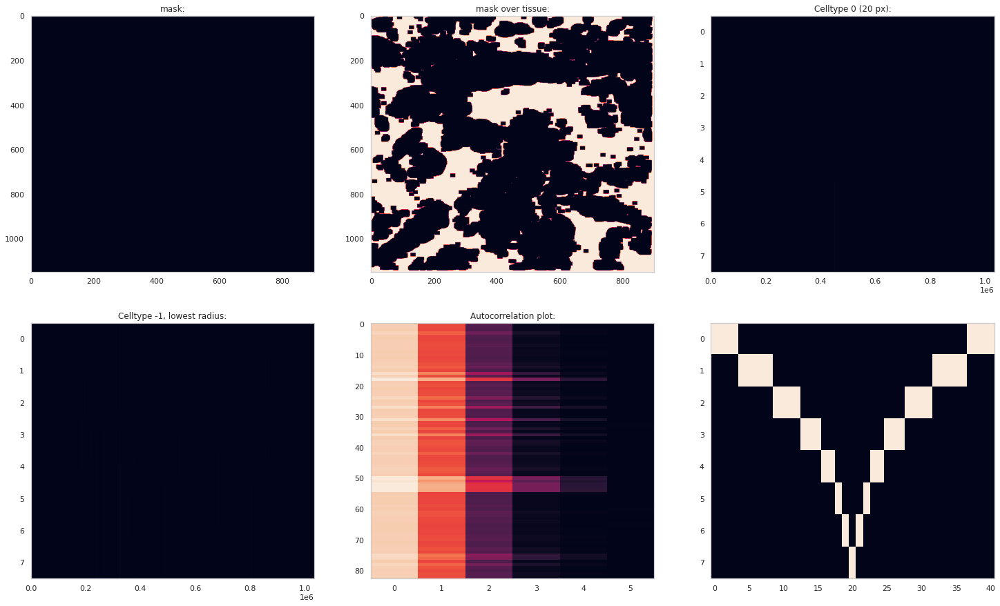

In [19]:
son.run_pipeline(max_radius= 20, cell_matrix = cm_resized, linear_steps=1, edge_correction=True, mask=False)

In [20]:
am = son.ambient_map
dm = son.distance_maps

autos = dm.diagonal().T
dm_norm = np.nan_to_num(dm/autos[:,0,None,None])

dm_norm = dm/autos[:,None,:].transpose([1,0,2])#,None,None]

kewl = dm_norm.reshape([dm_norm.shape[0],-1])

In [21]:
from sklearn.decomposition import PCA as PCA

pca = PCA(n_components = 17)
facs = pca.fit_transform(kewl)

In [22]:
exps = np.array(exp_mat_thematic)
exps = (exps.T/(exps.sum(1)+0.001)).T

%matplotlib inline

imgs = np.zeros((len(clusters_thematic),)+cm_resized.shape[1:])

for fac in range(facs.shape[1]):

    img = ((am[:,-1]*facs[:,fac,None]).sum(0).reshape(cm_resized.shape[1:]))

    imgs+=img[None]*(np.inner(exps.astype(float),facs[:,fac])[:,None,None])
#     print(img.mean(),img.std())
    
#     plt.figure()
#     plt.imshow(img)



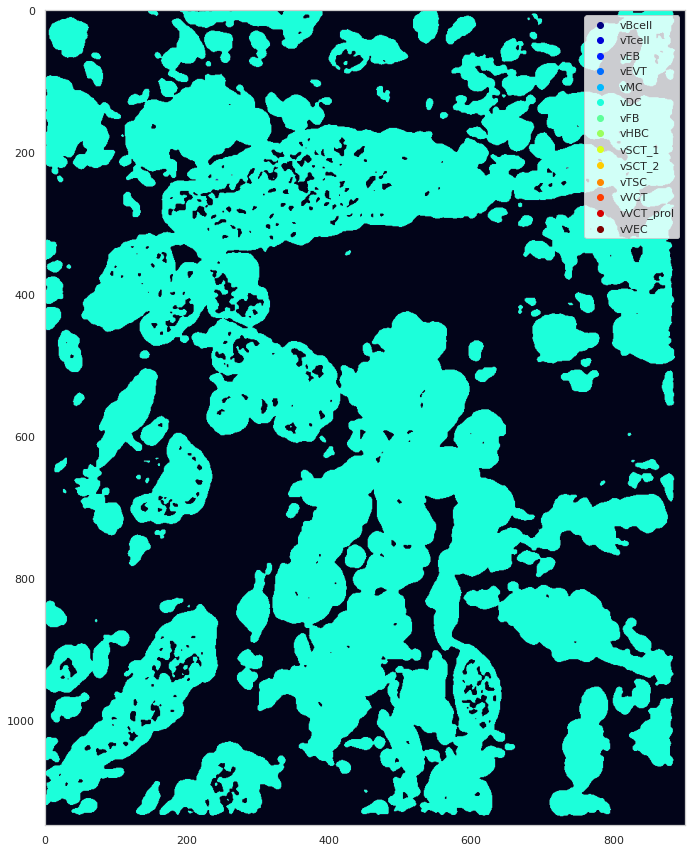

In [23]:
plt.figure(figsize=(15,15))

for i,color in  enumerate(colors):
    
    img =  (imgs.argmax(0)*( cm_resized.sum(0)>0.03))==i
#     img =  (imgs.argmax(0)*( imgs.mean(0)>0))==i
    plt.imshow(img[:,:,None]*color,alpha=img.astype(float))
    plt.scatter([],[],color=color)
    
    
alpha = ((cm_resized.sum(0)<0.03)).astype(float)
plt.imshow(np.zeros(cm_resized.shape[1:], dtype=float),alpha=alpha)
    
plt.legend(clusters_thematic)

# plt.xlim([0,500])
    
# plt.ylim([0,500])
    

<IPython.core.display.Javascript object>


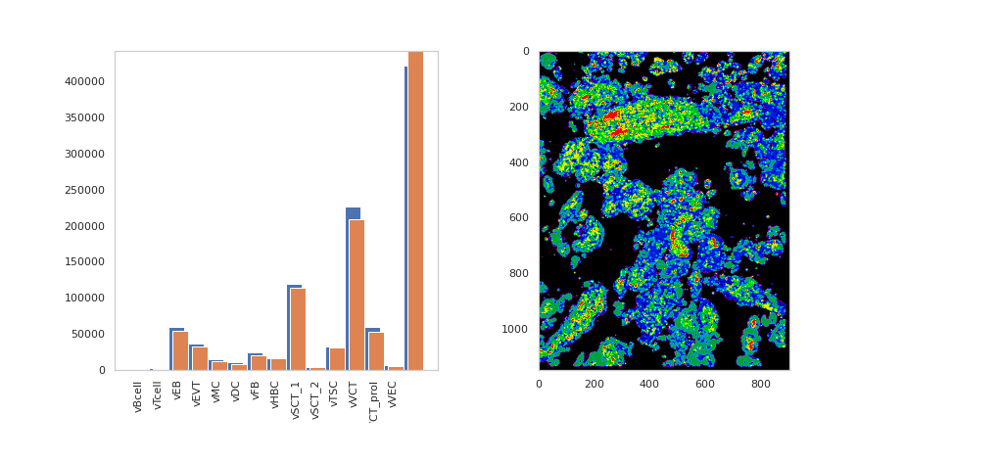

/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/ipykernel_launcher.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


In [24]:
%matplotlib notebook

import tqdm, torch

kernel_inf = 0
device='cpu'

bg_area = ( cm_resized.sum(0)>0).mean()#+1

# sample_tissue = torch.tensor(np.concatenate([cm_resized,(imgs.std()-imgs.sum(0))[None],]), device=device)
sample_tissue = torch.tensor(np.concatenate([imgs,(imgs.std()-imgs.sum(0))[None],]), device=device)
cell_counts = torch.tensor(list(early_probs)+[sum(early_probs)*bg_area], device=device)
exp_counts=(cell_counts/cell_counts.sum()*np.prod(sample_tissue.shape[1:]))#*edge**2) 
# exp_counts = (exp_counts+cell_counts)/2

fig = plt.figure(figsize=(13,6))
ax1 = plt.subplot(121)
plt.xticks(np.arange(len(clusters_thematic)),clusters_thematic,rotation=90)
ax2 = plt.subplot(122)


opt = torch.tensor(sample_tissue, device=device)+1#sample_tissue.std()/1000
opt[opt<0.0001]=0.0001#=opt.min()-0.001#
opt = (opt.T/((0.1+opt.sum(-1).sum(-1)))).T

# exp_counts = (exp_counts+opt.sum(-1).sum(-1)/opt.sum()*exp_counts.sum())/2


bar1 = ax1.bar(np.arange(exp_counts.shape[0])-0.1,exp_counts.cpu())
bar2 = ax1.bar(np.arange(exp_counts.shape[0])+0.1,(opt.sum(-1).sum(-1)).cpu())

img2 = ax2.imshow(-sample_tissue.argmax(0).cpu(),
                   vmin=-len(exp_counts)+1, vmax=0,cmap='nipy_spectral') #

epochs = 20

outs = []

fig.canvas.draw()

alpha = 0.7
beta = 1.05

for i in tqdm.tqdm_notebook(range(300)):
    opt = opt**(beta)#+i*0.01)
    opt=opt/opt.sum(0)#.softmax(0)
    img2.set_data(-opt.argmax(0).cpu())
    fig.canvas.draw()

    
#     bar1.set_data(np.arange(exp_counts.shape[0])-0.1,exp_counts.cpu())
    sewmz = (opt.sum(-1).sum(-1)).cpu()
    [b.set_height(sewmz[i]) for i,b in enumerate(bar2)]
#         opt = (opt.T/((0.1+opt.sum(-1).sum(-1))/(exp_counts**(i/100))+0.00)).T
    opt = opt*alpha+(1-alpha)*(opt.T/((0.001+opt.sum(-1).sum(-1))/(exp_counts**(1.))+0.001)).T
    
    

    
 
    
    

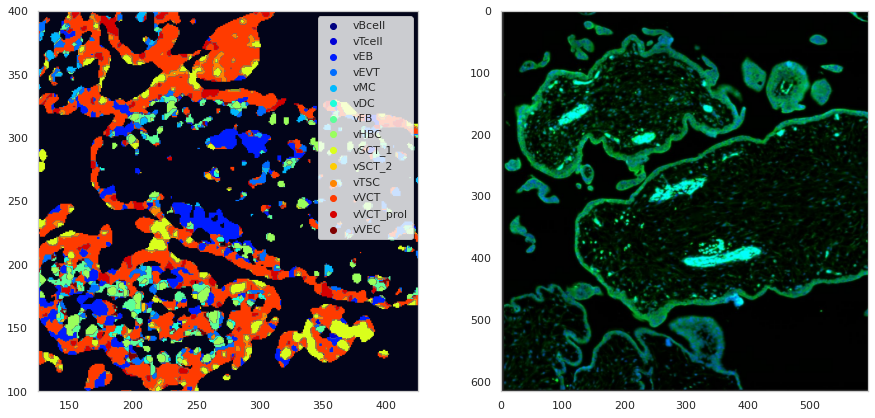

In [25]:
%matplotlib inline


plt.figure(figsize=(15,7))

plt.subplot(1,2,1)

for i,color in  enumerate(colors+[np.array([0.0,0.0,0.0,1.0])]):
    
    img =  (opt.cpu().numpy().argmax(0))==i
#     img =  (imgs.argmax(0)*( imgs.mean(0)>0))==i
    plt.imshow(img[:,:,None]*color,alpha=img.astype(float))
    plt.scatter([],[],color=color)
    
    
alpha = ((cm_resized.sum(0)<0.1)).astype(float)
# alpha = (ds.filtered_celltype_maps==-1).squeeze().astype(float)

plt.imshow(np.zeros(cm_resized.shape[1:], dtype=float),alpha=alpha)
    
plt.legend(clusters_thematic)
# plt.show()


plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)


plt.subplot(1,2,2)
flou = plt.imread(os.path.join(path,'flou_early.png'))
plt.imshow(flou)

# plt.savefig(os.path.join(path,'..','output','figures','cropped_early.pdf'))


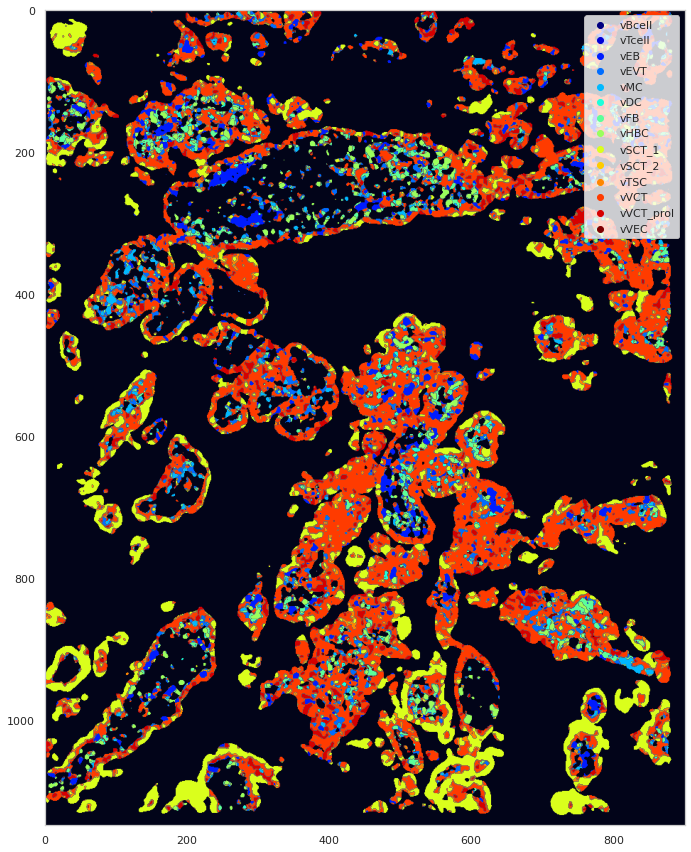

In [26]:
%matplotlib inline


plt.figure(figsize=(15,15))

for i,color in  enumerate(colors):#+[np.array([0.0,0.0,0.0,1.0])]):
    
    img =  (opt.cpu().numpy().argmax(0))==i
#     img =  (imgs.argmax(0)*( imgs.mean(0)>0))==i

#     alpha = alpha*(img<0)
    plt.imshow(img[:,:,None]*color,alpha=img.astype(float))
    plt.scatter([],[],color=color)
    

    
alpha = ((cm_resized.sum(0)<0.09))#+((opt.cpu().numpy().argmax(0))==len(colors))

plt.imshow(np.zeros(cm_resized.shape[1:], dtype=float),alpha=(alpha).astype(float))
    
plt.legend(clusters_thematic)
plt.savefig(os.path.join(path,'..','output','figures',prefix+'complete_clrs.pdf'))

     


In [27]:
# alpha = ((cm_resized.sum(0)<0.1))+((opt.cpu().numpy().argmax(0))==len(colors))


tissue_map = np.argmax(opt.cpu(),0)
tissue_matrix = np.array([np.array(tissue_map==i) for i in range(len(clusters_thematic))])
# tissue_matrix[:,alpha]=0

Creating ambient maps...


/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/sonar.py:208: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.cell_matrix = torch.tensor(cell_matrix,device=device)



(35, 1001, 1001)


/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/sonar.py:165: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_sample[:img_shape[0],:img_shape[1]] = torch.tensor(tissue_mask, dtype=torch.float, device=device)



Integrating data...


/home/tiesmeys/anaconda3/envs/ssam/lib/python3.7/site-packages/sonar.py:341: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  plt.imshow(torch.tensor(mask).cpu()-(2*(cell_contours>0)),aspect='auto')


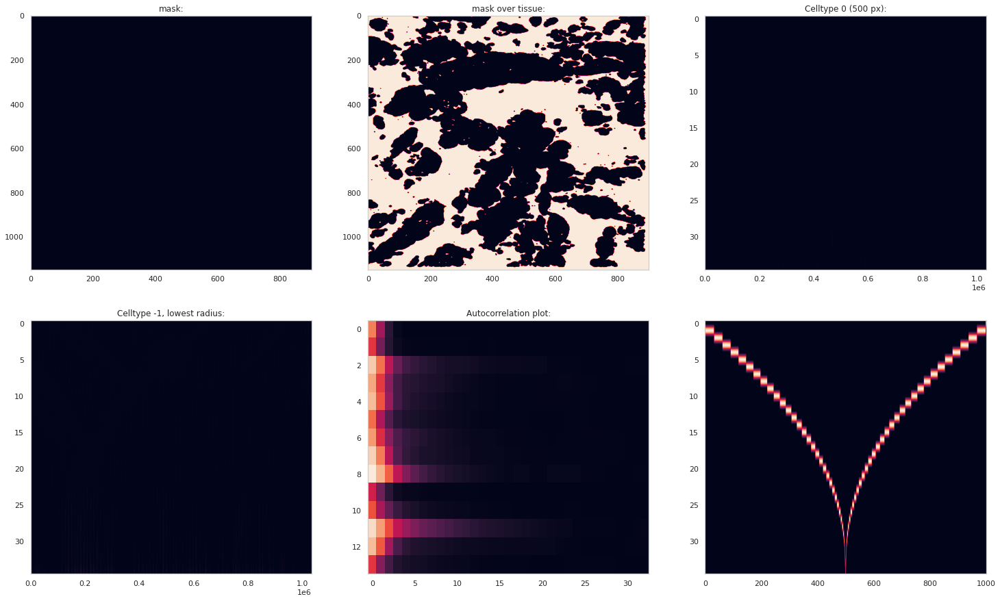

In [28]:
son1 = sonar.Sonar()
son1.run_pipeline(max_radius= 500, cell_matrix = tissue_matrix, linear_steps=2, edge_correction=True, mask=False)
am1 = son1.ambient_map
dm1 = son1.distance_maps

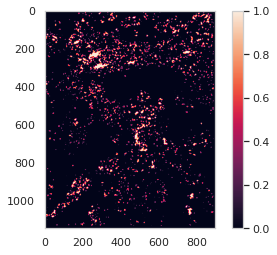

In [29]:
# plt.imshow(am2[1,-5:].sum(0))
plt.imshow(tissue_matrix[2])
plt.colorbar()

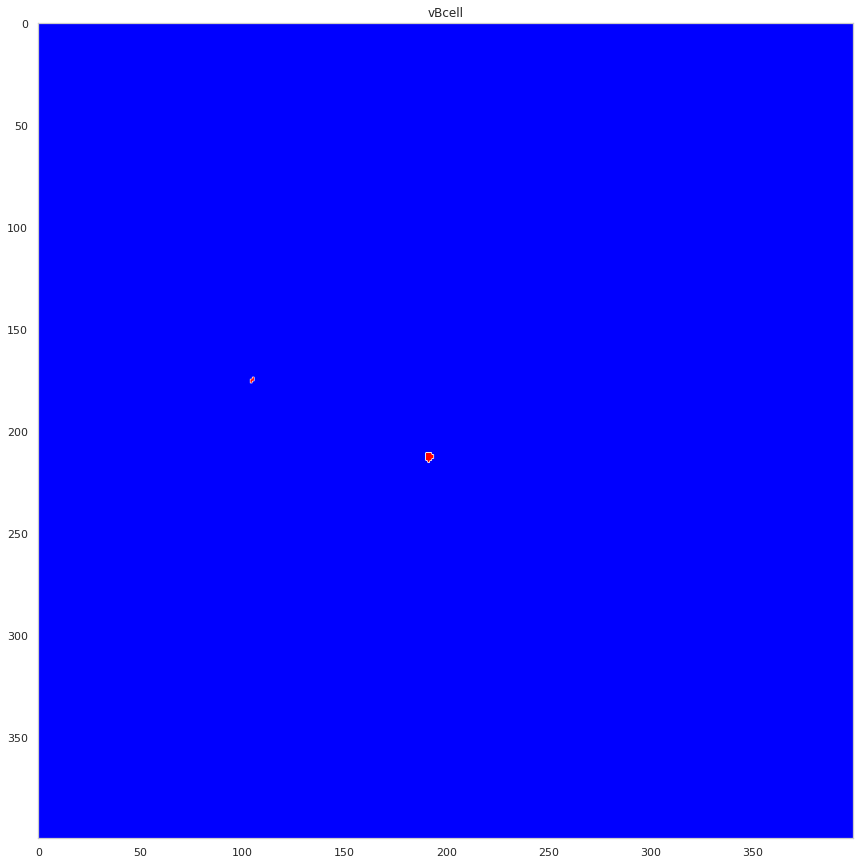

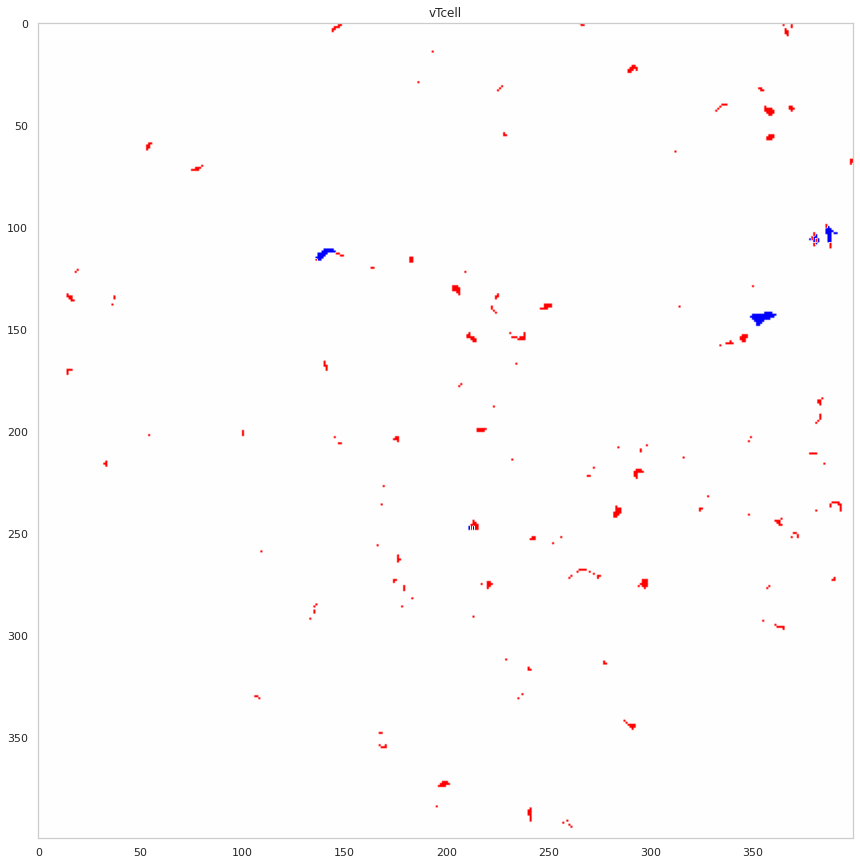

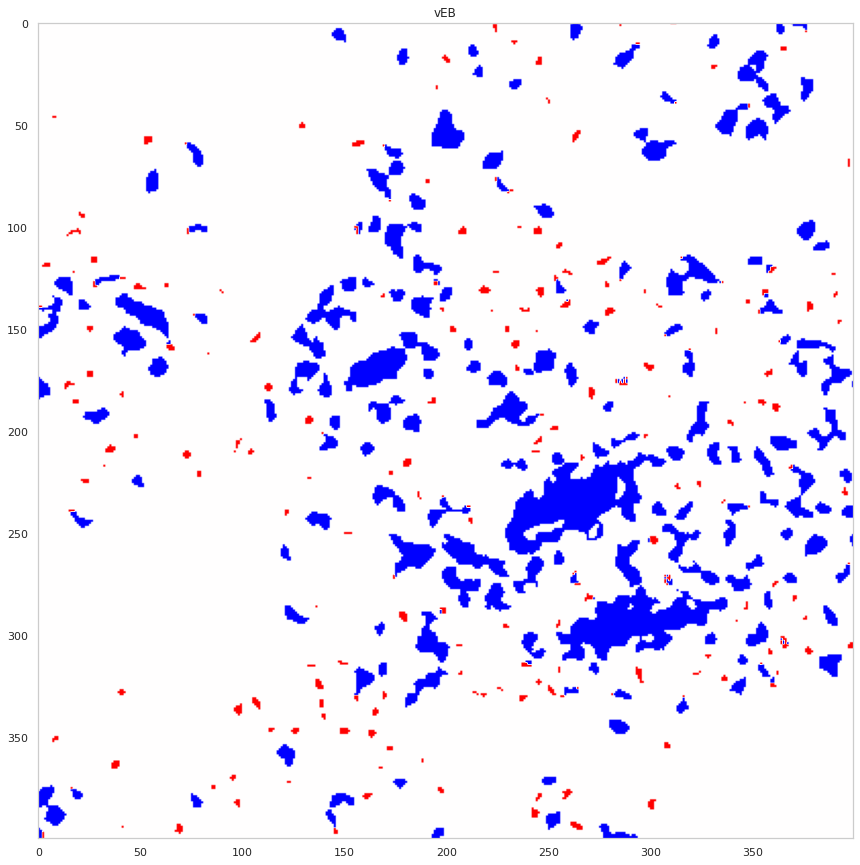

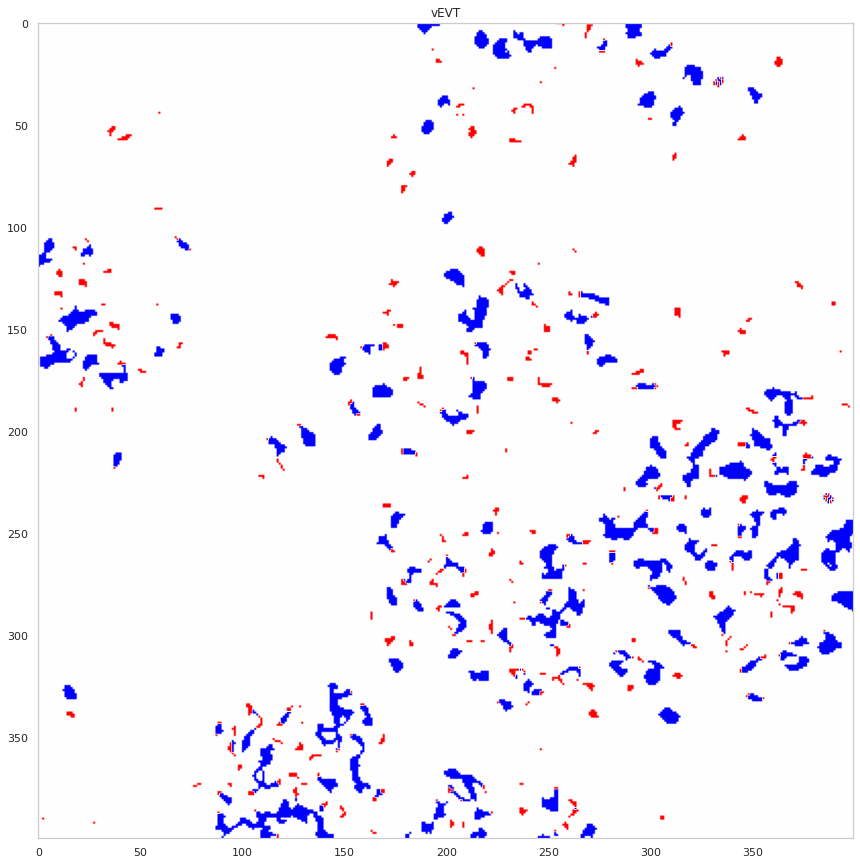

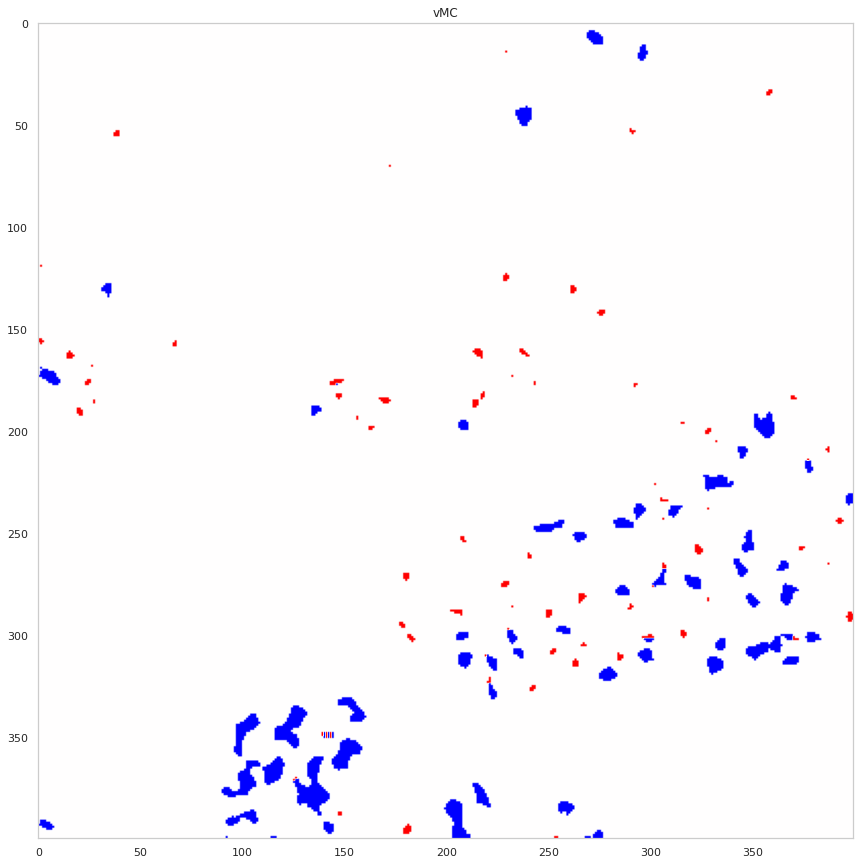

...

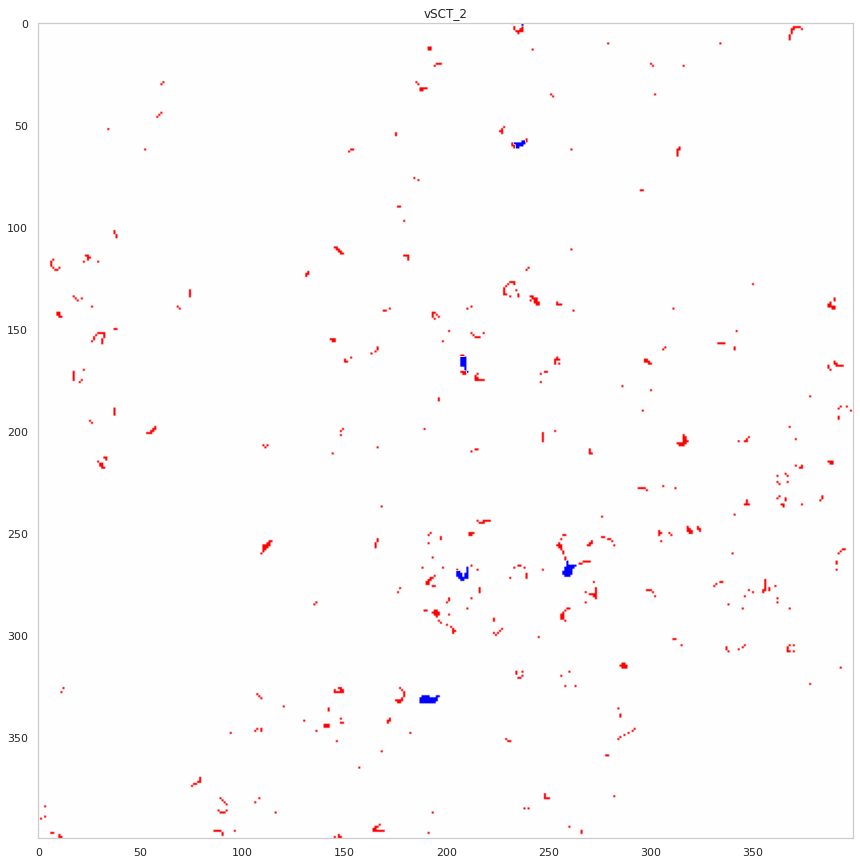

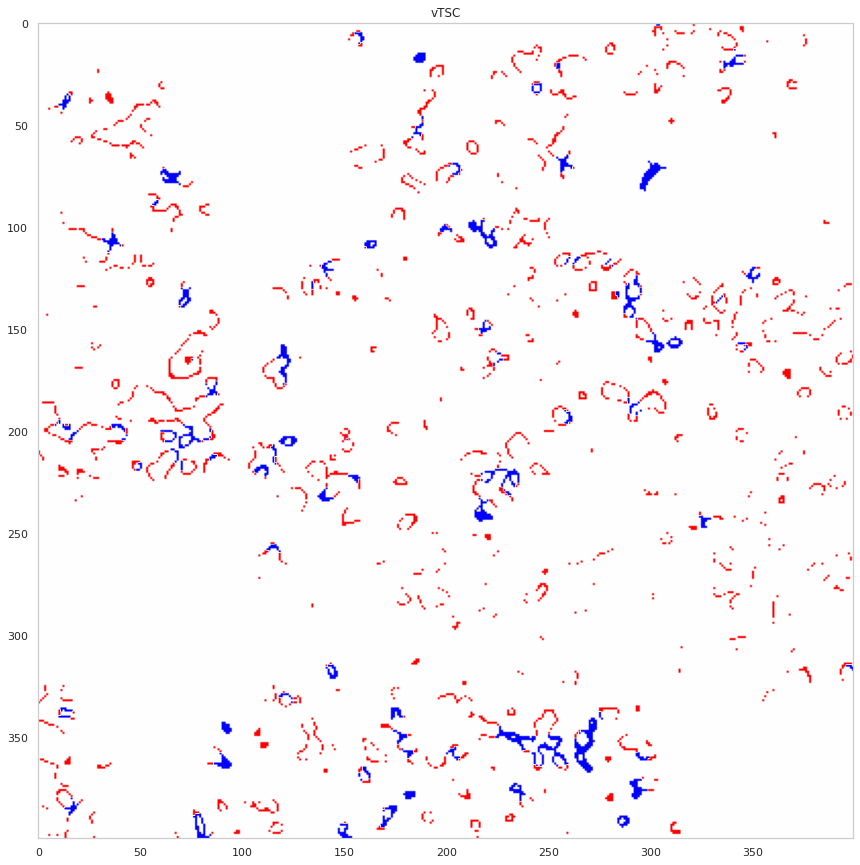

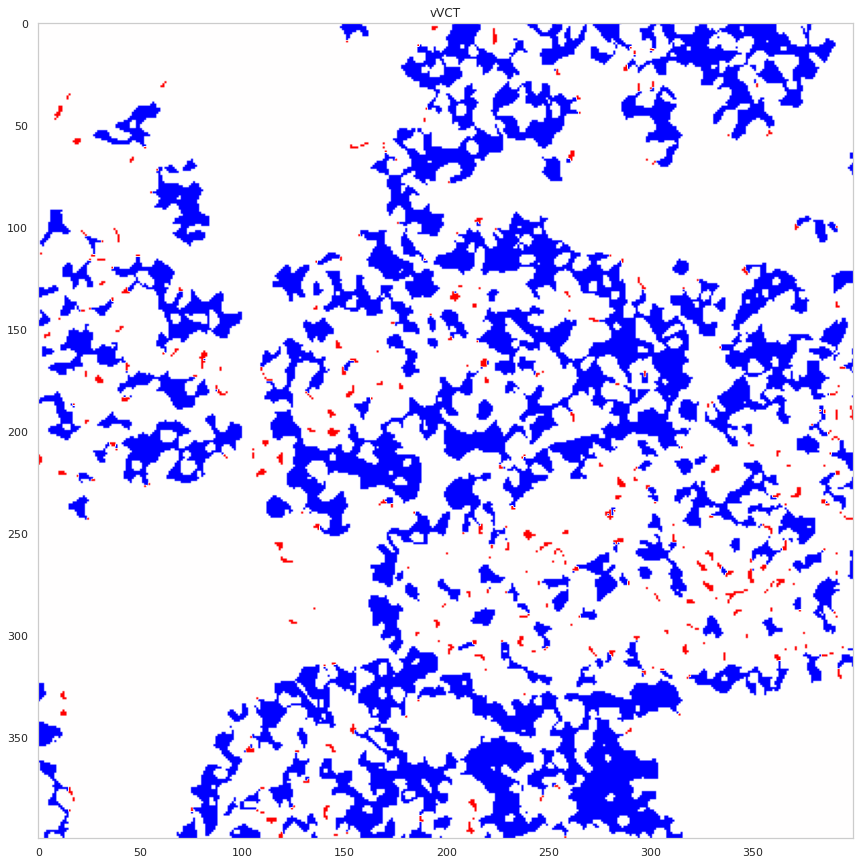

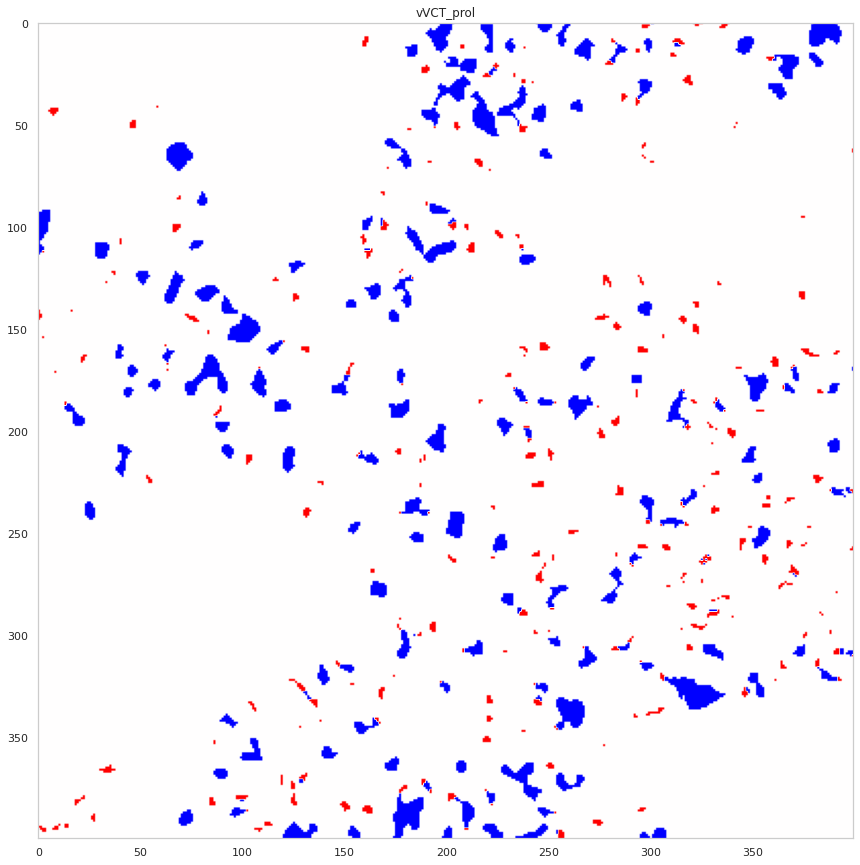

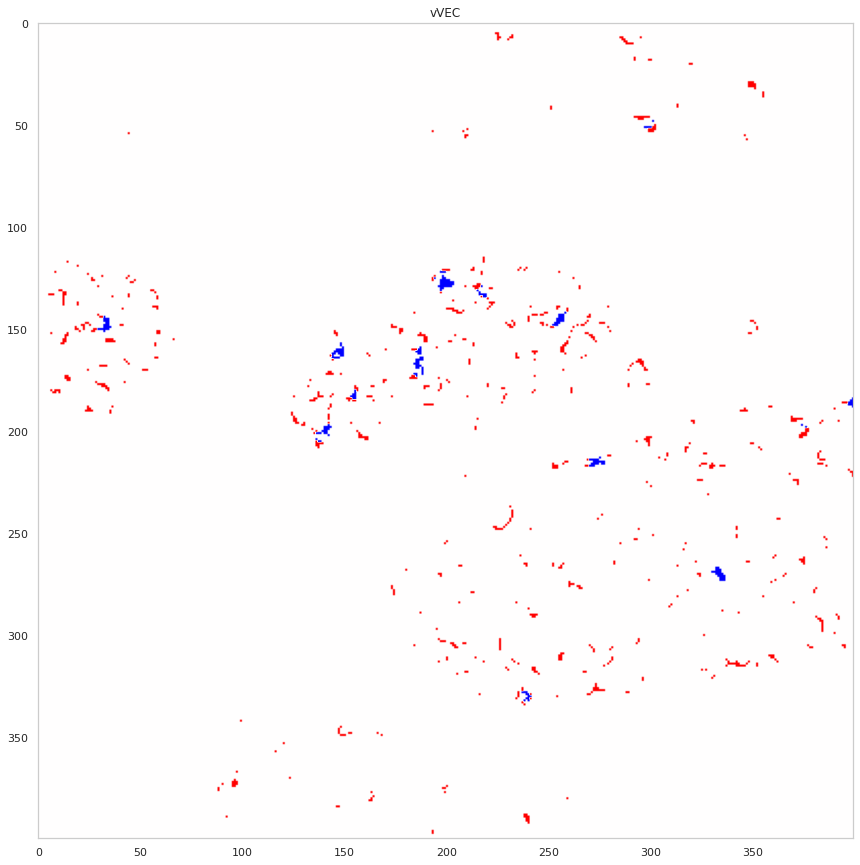

In [30]:
tissue_map1 = tissue_map.numpy().copy()
# am1[4,-20:].sum(0).reshape(tissue_map.shape)

am2 = am1.reshape(am1.shape[:2]+tissue_map.shape)*son1.kernel_areas[None,:,None,None]
# filtered = ((am2[4,-4:].sum(0)))>2.5

for i in range(len(clusters_thematic)):
    plt.figure(figsize=(15,15))
    plt.title(clusters_thematic[i])
    plt.imshow((-2*(((am2[i,-5:]).sum(0)>17)*tissue_matrix[i]*1)+(tissue_matrix[i]))[:400,:400],cmap='bwr')

In [31]:

tmf = np.zeros_like(tissue_matrix)

for i in range(tissue_matrix.shape[0]):

    tmf[i] = (((am2[i,-5:]).sum(0)>17)*tissue_matrix[i]*1.0)

alpha = (tmf.sum(0)==0 ).astype(float)

In [32]:
from PIL import ImageColor

clrs_pub = '''vSCT_1= #FF99CC
vSCT_2= #FF0080
vSCTjuv= #CC33FF
vVCT= #00B3B3
vVCT_prol= #004d4d
vEVT= #5C7AFF
vTSC= #FF0000
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vBcell= #7d8cc4
vEB= #e60000'''.split('\n')

clrs_pub={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_pub}
print(clrs_pub)

{'vSCT_1': (255, 153, 204, 255), 'vSCT_2': (255, 0, 128, 255), 'vSCTjuv': (204, 51, 255, 255), 'vVCT': (0, 179, 179, 255), 'vVCT_prol': (0, 77, 77, 255), 'vEVT': (92, 122, 255, 255), 'vTSC': (255, 0, 0, 255), 'vFB': (222, 193, 255, 255), 'vMC': (99, 38, 74, 255), 'vVEC': (253, 150, 169, 255), 'vHBC': (254, 103, 118, 255), 'vDC': (192, 201, 153, 255), 'vTcell': (167, 153, 183, 255), 'vBcell': (125, 140, 196, 255), 'vEB': (230, 0, 0, 255)}


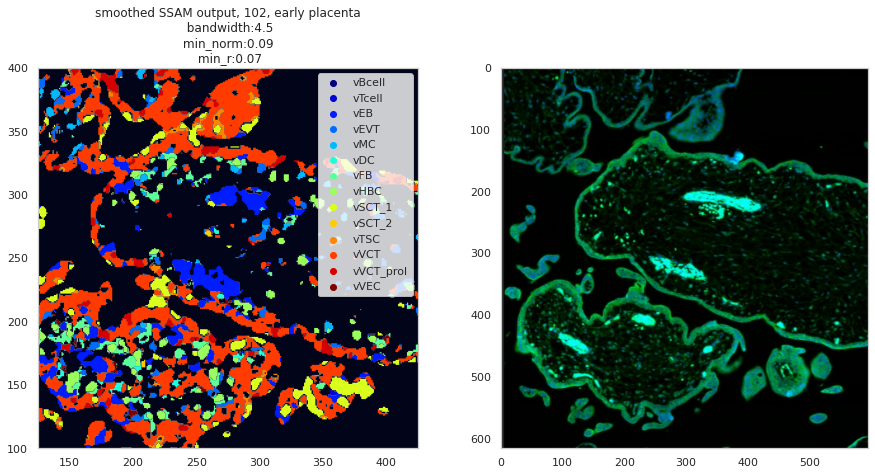

In [33]:
%matplotlib inline


plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
alpha = np.ones_like(tmf[0])

for i,color in  enumerate(colors):
    
    img =  tmf[i]#(((am2[i,-4:]).sum(0)>5)*tissue_matrix[i]*1.0)
    clr_pub = np.array(clrs_pub[clusters_thematic[i]])/255.0

    alpha = alpha^(img>0)

    plt.imshow(img[:,:,None]*color,alpha=img.astype(float))
    plt.scatter([],[],color=color)
    
    
alpha = alpha | ((cm_resized.sum(0)<0.1))
# alpha = (ds.filtered_celltype_maps==-1).squeeze().astype(float)[::2,::2]
plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))

# colors = ds.plot_celltypes_map(rotate=0, set_alpha=True, )

[plt.scatter([],[] , color=c) for c in colors]

_=plt.legend(labels=clusters_thematic)


plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)
    
plt.title(title+'\n  bandwidth:%s \n min_norm:%s \n min_r:%s'%(bandwidth,min_norm,min_r))
   
plt.subplot(1,2,2)
flou = plt.imread(os.path.join(path,hist_file))
plt.imshow(flou[::-1])#.transpose((1,0,2)))

plt.savefig(os.path.join(path,'..','output','figures',prefix+'cropped_clrs.pdf'))



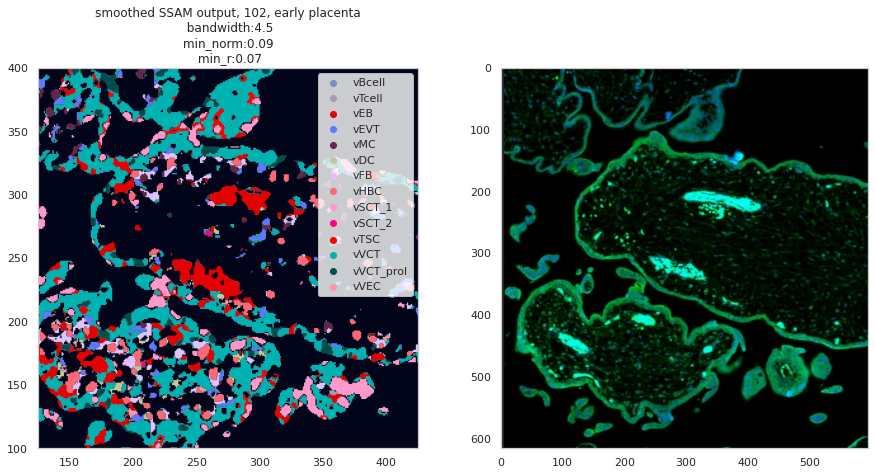

In [34]:
%matplotlib inline


plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
alpha = np.ones_like(tmf[0])

for i,color in  enumerate(colors):
    
    img =  tmf[i]#(((am2[i,-4:]).sum(0)>5)*tissue_matrix[i]*1.0)
    clr_pub = np.array(clrs_pub[clusters_thematic[i]])/255.0

    alpha = alpha^(img>0)
    
    plt.imshow(img[:,:,None]*clr_pub,alpha=(img).astype(float))
    plt.scatter([],[],color=clr_pub[:,None].T)
    
    
alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)
plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))
_=plt.legend(labels=clusters_thematic)



plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)
    
plt.title(title+'\n  bandwidth:%s \n min_norm:%s \n min_r:%s'%(bandwidth,min_norm,min_r))
   
plt.subplot(1,2,2)
flou = plt.imread(os.path.join(path,hist_file))
plt.imshow(flou[::-1])#.transpose((1,0,2)))

plt.savefig(os.path.join(path,'..','output','figures',prefix+'cropped.pdf'))



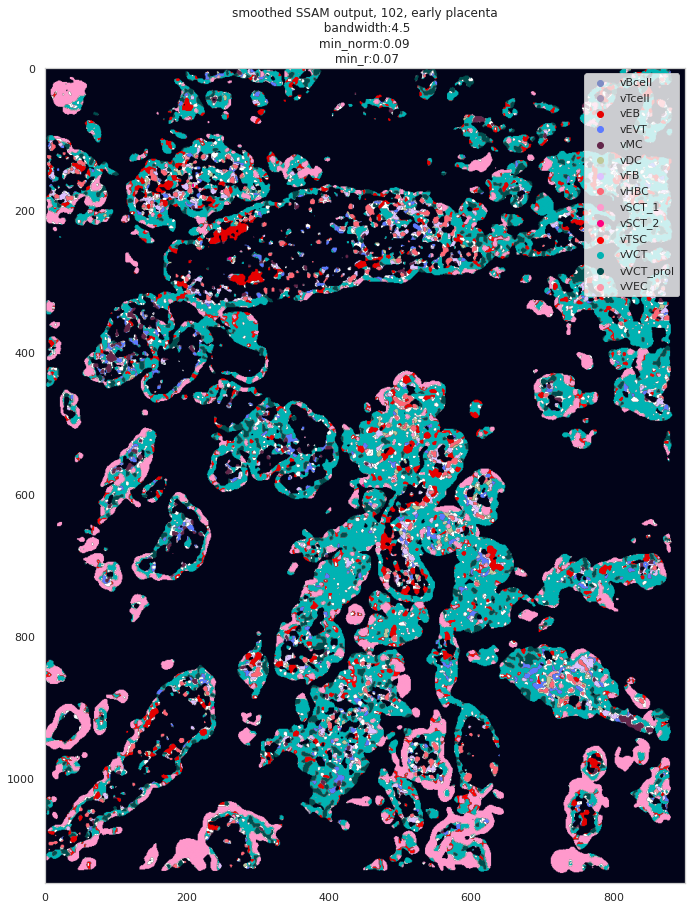

In [35]:
%matplotlib inline


plt.figure(figsize=(15,15))
alpha = np.ones_like(tmf[0])

for i,color in  enumerate(colors):
    
    img =  tmf[i]#(((am2[i,-4:]).sum(0)>5)*tissue_matrix[i]*1.0)
    clr_pub = np.array(clrs_pub[clusters_thematic[i]])/255.0

    alpha = alpha^(img>0)
    
    plt.imshow(img[:,:,None]*clr_pub,alpha=(img).astype(float))
    plt.scatter([],[],color=clr_pub[:,None].T)
    
    
alpha = ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)
plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=alpha.astype(float))
plt.title(title+'\n  bandwidth:%s \n min_norm:%s \n min_r:%s'%(bandwidth,min_norm,min_r))

plt.legend(clusters_thematic)
plt.savefig(os.path.join(path,'..','output','figures',prefix+'complete.pdf'))


# plt.xlim([100,550])
# plt.ylim([450,50])
         


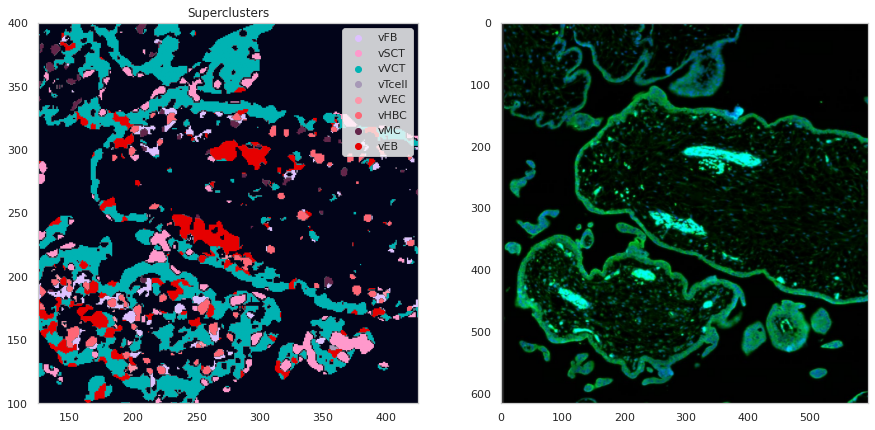

In [36]:
superclusters = {'vFB':['vFB'],
 'vSCT':['vSCT_1','vSCT_2'],
 'vVCT':['vVCT','vVCT_prol'],
 'vTcell':['vTcell'],
 'vVEC':['vVEC'],
 'vHBC':['vHBC'],
 'vMC':['vMC'],
 'vEB':['vEB'],
}

clrs_sc = '''vSCT= #FF99CC
vVCT= #00B3B3
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vEB= #e60000'''.split('\n')

clrs_sc={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_sc}

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)

alpha = np.ones_like(tmf[0])

# alpha = ((cm_resized.sum(0)<0.04))+((opt.cpu().numpy().argmax(0))==len(colors))
# imgs = np.zeros_like(alpha)

for i,sc in enumerate(superclusters):
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in superclusters[sc]],axis=0).squeeze()

    alpha = alpha^(img>0)
#     imgs = imgs+img#.astype(int)
    clr_sc = np.array(clrs_sc[sc])/255.0
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))
    
    plt.scatter([],[],color=clr_sc)

    plt.title('Superclusters')
    
alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)

plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))
plt.legend(list(superclusters.keys()))


plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)


plt.subplot(1,2,2)
flou = plt.imread(os.path.join(path,hist_file))
plt.imshow(flou[::-1])#.transpose((1,0,2)))
plt.savefig(os.path.join(path,'..','output','figures',prefix+'superclusters.pdf'))


In [37]:
list(clrs_pub.keys())

['vSCT_1',
 'vSCT_2',
 'vSCTjuv',
 'vVCT',
 'vVCT_prol',
 'vEVT',
 'vTSC',
 'vFB',
 'vMC',
 'vVEC',
 'vHBC',
 'vDC',
 'vTcell',
 'vBcell',
 'vEB']

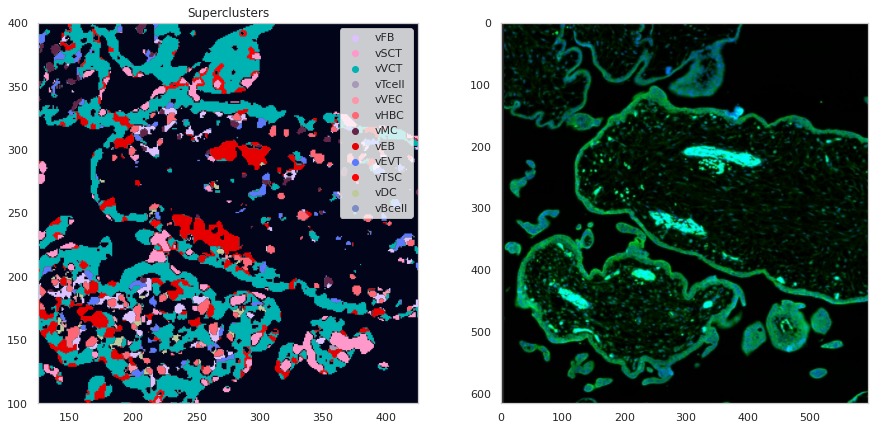

In [38]:
clusters_joined = {'vFB':['vFB'],
 'vSCT':['vSCT_1','vSCT_2'],
 'vVCT':['vVCT','vVCT_prol'],
 'vTcell':['vTcell'],
 'vVEC':['vVEC'],
 'vHBC':['vHBC'],
 'vMC':['vMC'],
 'vEB':['vEB'],
 'vEVT':['vEVT'],
 'vTSC':['vTSC'],
 'vFB':['vFB'],
 'vVEC':['vVEC'],
 'vDC':['vDC'],
 'vBcell':['vBcell'],
 }

clrs_sc = '''vSCT= #FF99CC
vVCT= #00B3B3
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vEB= #e60000'''.split('\n')

clrs_sc={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_sc}

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)

alpha = np.ones_like(tmf[0])

# alpha = ((cm_resized.sum(0)<0.04))+((opt.cpu().numpy().argmax(0))==len(colors))
# imgs = np.zeros_like(alpha)

for i,sc in enumerate(clusters_joined):
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in clusters_joined[sc]],axis=0).squeeze()

    alpha = alpha^(img>0)
#     imgs = imgs+img#.astype(int)

    if sc in clrs_sc:
        clr_sc = np.array(clrs_sc[sc])/255.0
    else:
        clr_sc = np.array(clrs_pub[sc])/255.0
        
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))
    
    plt.scatter([],[],color=clr_sc)

    plt.title('Superclusters')
    
alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)

plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))
plt.legend(list(clusters_joined.keys()))


plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)


plt.subplot(1,2,2)
flou = plt.imread(os.path.join(path,hist_file))
plt.imshow(flou[::-1])#.transpose((1,0,2)))
plt.savefig(os.path.join(path,'..','output','figures',prefix+'superclusters.pdf'))


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


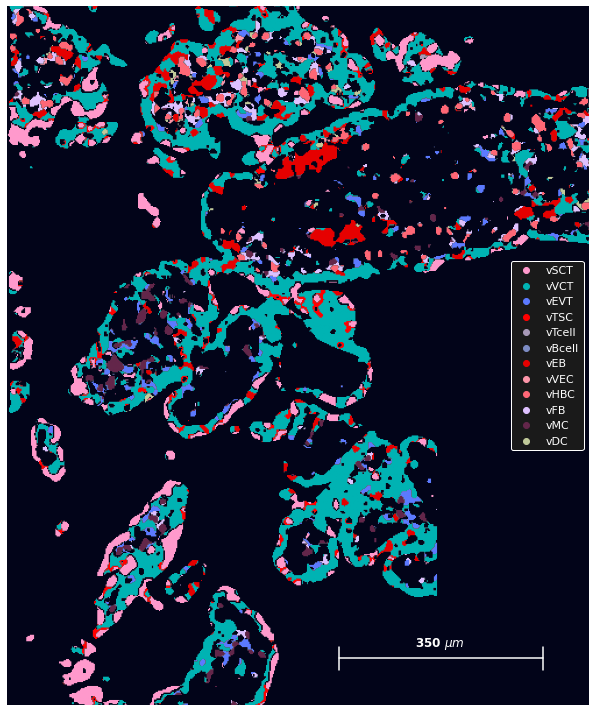

In [39]:
from matplotlib import cm

plt.figure(figsize=(10,10))

alpha = np.ones_like(tmf[0])
clusters_joined = {
 'vSCT':['vSCT_1','vSCT_2'],
 'vVCT':['vVCT','vVCT_prol'],
 'vEVT':['vEVT'],
 'vTSC':['vTSC'],
 'vTcell':['vTcell'],
 'vBcell':['vBcell'],
 'vEB':['vEB'],
 'vVEC':['vVEC'],
 'vHBC':['vHBC'],
 'vFB':['vFB'],
 'vMC':['vMC'],
 'vDC':['vDC'],
 }

clrs_sc = '''vSCT= #FF99CC
vVCT= #00B3B3
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vEB= #e60000'''.split('\n')

clrs_sc={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_sc}


alpha = np.ones_like(tmf[0])

# alpha = ((cm_resized.sum(0)<0.04))+((opt.cpu().numpy().argmax(0))==len(colors))
# imgs = np.zeros_like(alpha)

for i,sc in enumerate(clusters_joined):
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in clusters_joined[sc]],axis=0).squeeze()

    alpha = alpha^(img>0)
#     imgs = imgs+img#.astype(int)

    if sc in clrs_sc:
        clr_sc = np.array(clrs_sc[sc])/255.0
    else:
        clr_sc = np.array(clrs_pub[sc])/255.0
        
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))
    
    plt.scatter([],[],color=clr_sc)
    
alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)



plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=alpha.astype(float))

mask = alpha.copy()
mask[610:,300:]=1
mask[350:,370:]=1
plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=mask.astype(float))
plt.legend(list(clusters_joined),loc='center right',labelcolor='w',
          facecolor='k',framealpha=1,edgecolor='w')

p1 = 285
p2 = 460
plt.plot([p1,p2],[660,660],c='w')
plt.plot([p1,p1],[650,670],c='w')
plt.plot([p2,p2],[650,670],c='w')


plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
    "font.serif": ["Palatino"],})

plt.text((p1+p2)//2, 650, '%i $\mu m$'%((p2-p1)*2), color='w', size='large',
         fontweight='bold',horizontalalignment='center')

plt.ylim((700,100))
plt.xlim((0,500))

plt.axis('off')
plt.tight_layout()

# plt.subplot(1,2,2)
# flou = plt.imread(os.path.join(path,'flou_PE_all.jpg'))
# plt.imshow(flou)#.transpose((1,0,2)))
plt.savefig(os.path.join(path,'..','output','figures',prefix+'all_celltypes_pub.svg'))


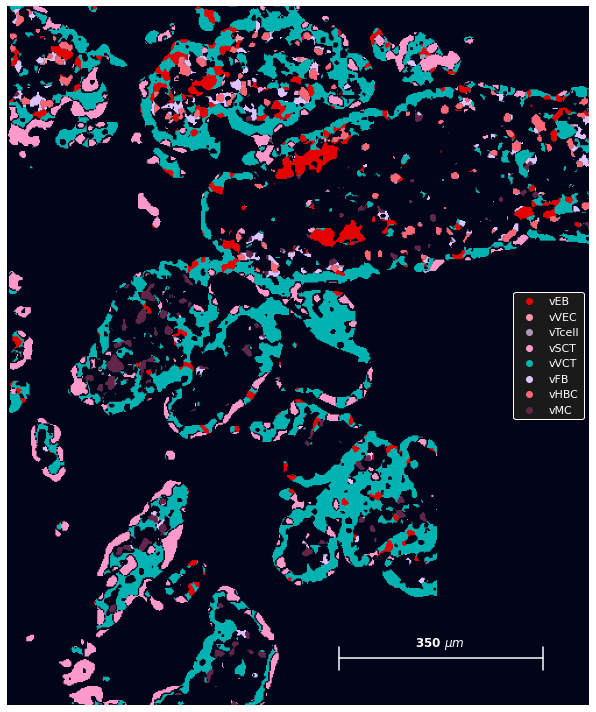

In [45]:
from matplotlib import cm


superclusters = {
 'vEB':['vEB'],
 'vVEC':['vVEC'],
 'vTcell':['vTcell'],
 'vSCT':['vSCT_1','vSCT_2'],
 'vVCT':['vVCT','vVCT_prol'],
 'vFB':['vFB'],
 'vHBC':['vHBC'],
 'vMC':['vMC'],
}

clrs_sc = '''vSCT= #FF99CC
vVCT= #00B3B3
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vEB= #e60000'''.split('\n')

clrs_sc={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_sc}

plt.figure(figsize=(10,10))

alpha = np.ones_like(tmf[0])

for i,sc in enumerate(superclusters):
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in superclusters[sc]],axis=0).squeeze()

    alpha = alpha^(img>0)
#     imgs = imgs+img#.astype(int)
#     clr_sc = cm.Set1(i/len(superclusters)) #np.array(clrs_sc[sc])/255.0
    clr_sc = np.array(clrs_sc[sc])/255.0
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))
    
    plt.scatter([],[],color=clr_sc)

#     plt.title('Superclusters')
    
alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)



plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=alpha.astype(float))

mask = alpha.copy()
mask[610:,300:]=1
mask[350:,370:]=1
plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=mask.astype(float))
plt.legend(list(superclusters.keys()),loc='center right',labelcolor='w',
          facecolor='k',framealpha=1,edgecolor='w')


p1 = 285
p2 = 460
plt.plot([p1,p2],[660,660],c='w')
plt.plot([p1,p1],[650,670],c='w')
plt.plot([p2,p2],[650,670],c='w')


plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
    "font.serif": ["Palatino"],})

plt.text((p1+p2)//2, 650, '%i $\mu m$'%((p2-p1)*2), color='w', size='large',
         fontweight='bold',horizontalalignment='center')

plt.ylim((700,100))
plt.xlim((0,500))

plt.axis('off')
plt.tight_layout()

# plt.subplot(1,2,2)
# flou = plt.imread(os.path.join(path,'flou_PE_all.jpg'))
# plt.imshow(flou)#.transpose((1,0,2)))
plt.savefig(os.path.join(path,'..','output','figures',prefix+'superclusters.svg'))


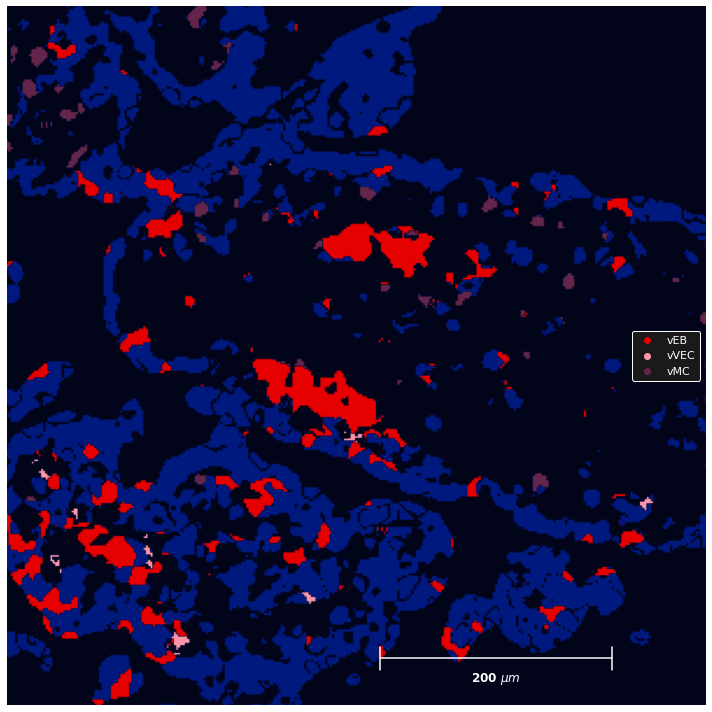

In [63]:
from matplotlib import cm


# vEB, vMC and vVEC 
# vHBC and vTcell  

superclusters = {
 'vEB':['vEB'],
 'vVEC':['vVEC'],
#  'vTcell':['vTcell'],
#  'vSCT':['vSCT_1','vSCT_2'],
#  'vVCT':['vVCT','vVCT_prol'],
#  'vFB':['vFB'],
#  'vHBC':['vHBC'],
 'vMC':['vMC'],
}

clrs_sc = '''vSCT= #FF99CC
vVCT= #00B3B3
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vEB= #e60000'''.split('\n')

clrs_sc={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_sc}

plt.figure(figsize=(10,10))
plt.imshow(np.ones(alpha.shape)[:,:,None]*np.array([0,0.1,0.5]))

for i,sc in enumerate(superclusters):
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in superclusters[sc]],axis=0).squeeze()

#     alpha = alpha^(img>0)
    
    clr_sc = np.array(clrs_sc[sc])/255.0
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))
    
    plt.scatter([],[],color=clr_sc)

    
# alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)


# plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))

# plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=alpha.astype(float))

mask = alpha.copy()
mask[610:,300:]=1
mask[350:,370:]=1
plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=mask.astype(float))
plt.legend(list(superclusters.keys()),loc='center right',labelcolor='w',
          facecolor='k',framealpha=1,edgecolor='w')


p1 = 285
p2 = p1+100
py = 120
plt.plot([p1,p2],[py,py],c='w')
plt.plot([p1,p1],[py-5,py+5],c='w')
plt.plot([p2,p2],[py-5,py+5],c='w')


plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
    "font.serif": ["Palatino"],})

plt.text((p1+p2)//2, py-10, '%i $\mu m$'%((p2-p1)*2), color='w', size='large',
         fontweight='bold',horizontalalignment='center')


plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)



plt.axis('off')
plt.tight_layout()

# plt.subplot(1,2,2)
# flou = plt.imread(os.path.join(path,'flou_PE_all.jpg'))
# plt.imshow(flou)#.transpose((1,0,2)))
plt.savefig(os.path.join(path,'..','output','figures',prefix+'_'+'_'.join(superclusters.keys())+'.svg'))


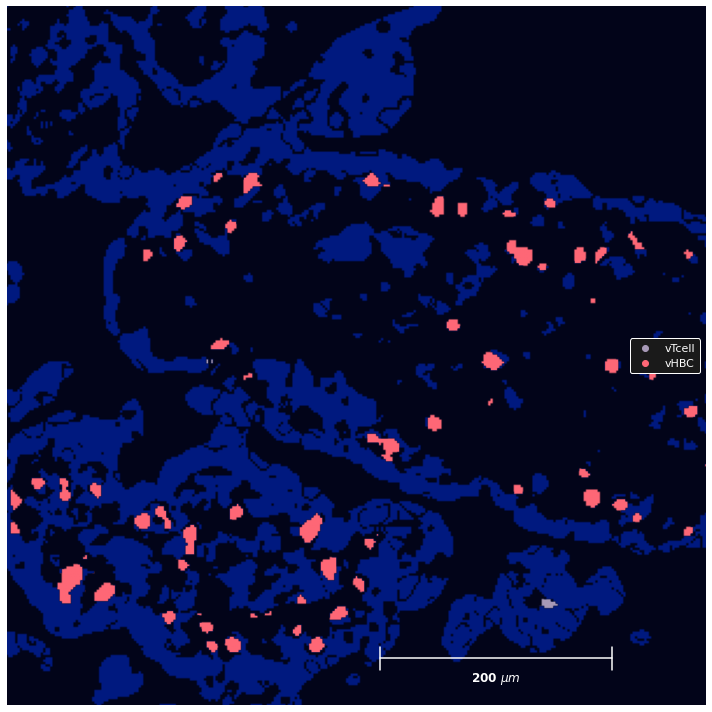

In [65]:
from matplotlib import cm


# vEB, vMC and vVEC 
# vHBC and vTcell  

superclusters = {
#  'vEB':['vEB'],
#  'vVEC':['vVEC'],
 'vTcell':['vTcell'],
#  'vSCT':['vSCT_1','vSCT_2'],
#  'vVCT':['vVCT','vVCT_prol'],
#  'vFB':['vFB'],
 'vHBC':['vHBC'],
#  'vMC':['vMC'],
}

clrs_sc = '''vSCT= #FF99CC
vVCT= #00B3B3
vFB= #DEC1FF
vMC= #63264A
vVEC= #FD96A9
vHBC= #FE6776
vDC= #C0C999
vTcell= #A799B7
vEB= #e60000'''.split('\n')

clrs_sc={c.split('= ')[0] : ImageColor.getcolor(c.split('= ')[1], "RGB")+(255,) for c in clrs_sc}

plt.figure(figsize=(10,10))
plt.imshow(np.ones(alpha.shape)[:,:,None]*np.array([0,0.1,0.5]))

for i,sc in enumerate(superclusters):
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in superclusters[sc]],axis=0).squeeze()

#     alpha = alpha^(img>0)
    
    clr_sc = np.array(clrs_sc[sc])/255.0
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))
    
    plt.scatter([],[],color=clr_sc)

    
# alpha = alpha | ((cm_resized.sum(0)<0.1))#+((opt.cpu().numpy().argmax(0))==len(colors)).astype(float)


# plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))

# plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=alpha.astype(float))

mask = alpha.copy()
mask[610:,300:]=1
mask[350:,370:]=1
plt.imshow(np.zeros(tmf.shape[1:], dtype=float),alpha=mask.astype(float))
plt.legend(list(superclusters.keys()),loc='center right',labelcolor='w',
          facecolor='k',framealpha=1,edgecolor='w')


p1 = 285
p2 = p1+100
py = 120
plt.plot([p1,p2],[py,py],c='w')
plt.plot([p1,p1],[py-5,py+5],c='w')
plt.plot([p2,p2],[py-5,py+5],c='w')


plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
    "font.serif": ["Palatino"],})

plt.text((p1+p2)//2, py-10, '%i $\mu m$'%((p2-p1)*2), color='w', size='large',
         fontweight='bold',horizontalalignment='center')


plt.ylim(np.array(ylims)//2)
plt.xlim(np.array(xlims)//2)



plt.axis('off')
plt.tight_layout()

# plt.subplot(1,2,2)
# flou = plt.imread(os.path.join(path,'flou_PE_all.jpg'))
# plt.imshow(flou)#.transpose((1,0,2)))
plt.savefig(os.path.join(path,'..','output','figures',prefix+'_'+'_'.join(superclusters.keys())+'.svg'))


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.


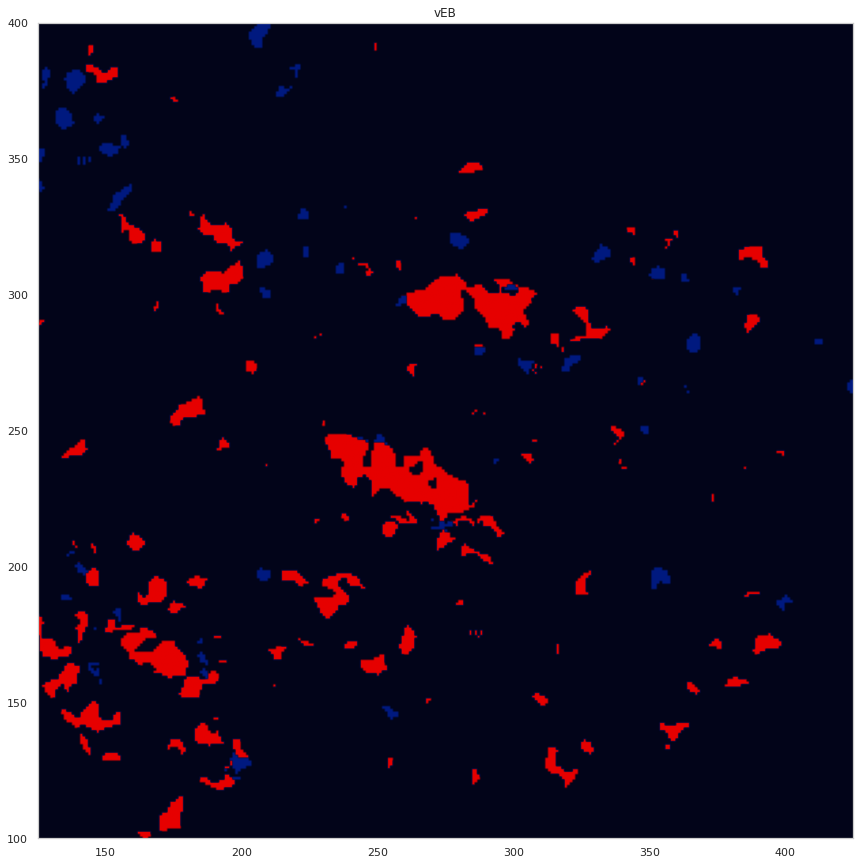

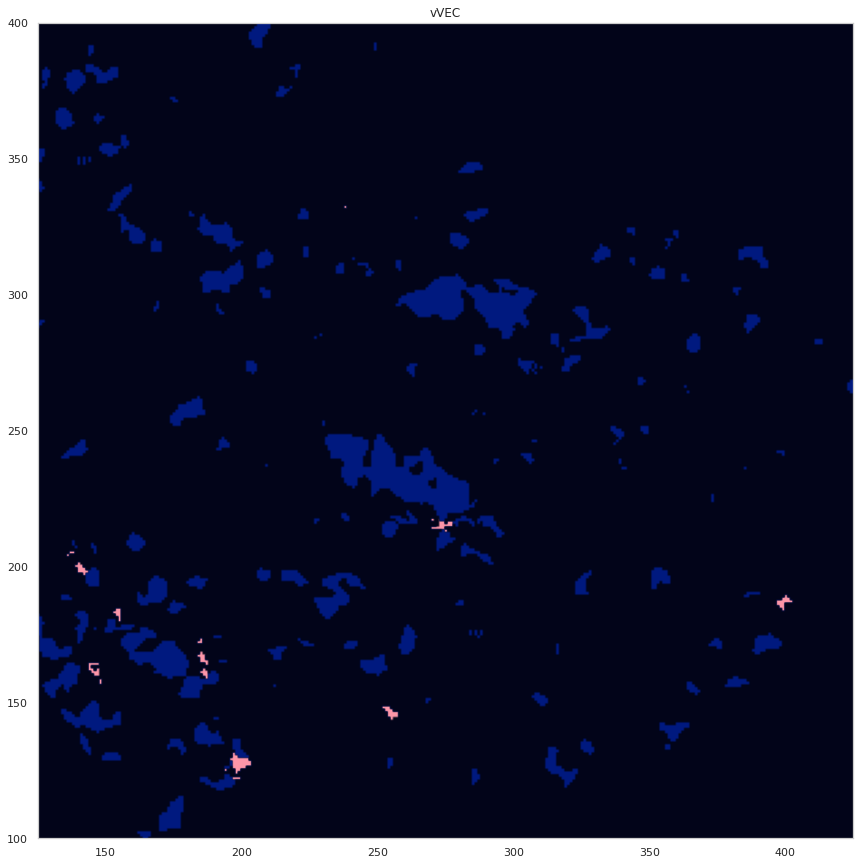

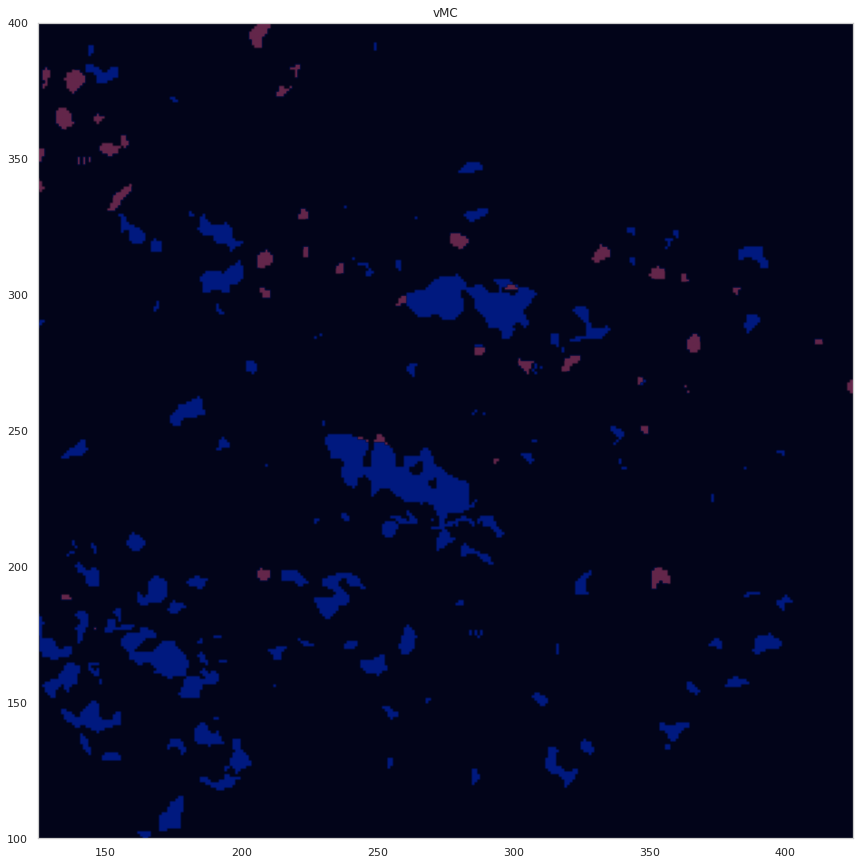

In [42]:
# superclusters = {'vFB':['vFB'],
#  'vSCT':['vSCT_1','vSCT_2'],
#  'vVCT':['vVCT','vVCT_prol'],
#  'vTcell':['vTcell'],
#  'vVEC':['vVEC'],
#  'vHBC':['vHBC'],
#  'vMC':['vMC'],
# }


for i,sc in enumerate(superclusters):
    
    plt.figure(figsize=(15,15))
#     plt.subplot(1,2,1)
    plt.imshow(np.ones(alpha.shape)[:,:,None]*np.array([0,0.1,0.5]))

#     plt.imshow(np.ones(cm_resized.shape[1:]+(3,)))

    img =  np.sum([tmf[clusters_thematic.index(i)] for i in superclusters[sc]],axis=0).squeeze()
    
    clr_sc = np.array(clrs_sc[sc])/255.0
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))

    plt.title(sc)
    
#     alpha = ((cm_resized.sum(0)<0.04))+((opt.cpu().numpy().argmax(0))==len(colors))
#     alpha = alpha|(img==0)
    plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))


    plt.ylim(np.array(ylims)//2)
    plt.xlim(np.array(xlims)//2)


#     plt.subplot(1,2,2)
#     flou = plt.imread(os.path.join(path,hist_file))
#     plt.imshow(flou[::-1])#.transpose((1,0,2)))
    plt.savefig(os.path.join(path,'..','output','figures',prefix+sc+'_.pdf'))

#     break

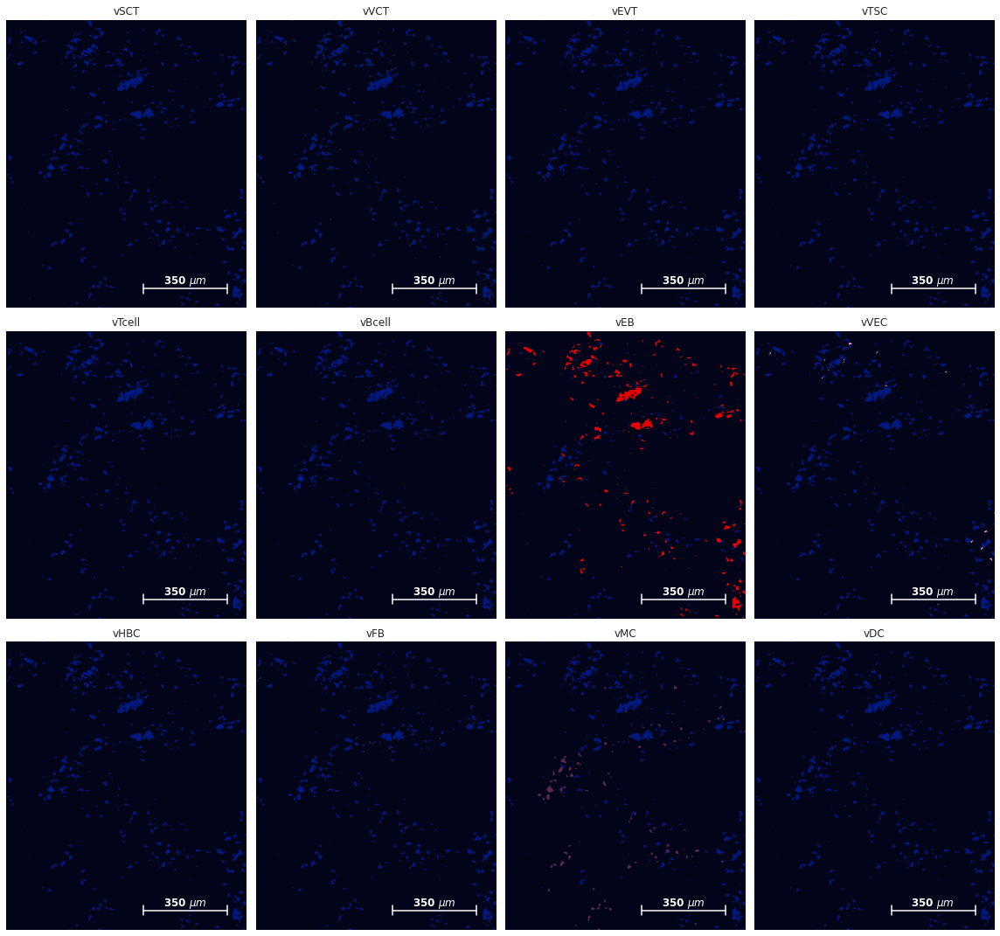

In [43]:
# superclusters = {'vFB':['vFB'],
#  'vSCT':['vSCT_1','vSCT_2'],
#  'vVCT':['vVCT','vVCT_prol'],
#  'vTcell':['vTcell'],
#  'vVEC':['vVEC'],
#  'vHBC':['vHBC'],
#  'vMC':['vMC'],
# }


plt.figure(figsize=(16,20))

for i,sc in enumerate(clusters_joined):
    
    plt.subplot(4,4,i+1)
    plt.imshow(np.ones(alpha.shape)[:,:,None]*np.array([0,0.1,0.5]))

    img =  np.sum([tmf[clusters_thematic.index(i)] for i in clusters_joined[sc]],axis=0).squeeze()
    
    if sc in clrs_sc:
        clr_sc = np.array(clrs_sc[sc])/255.0
    else:
        clr_sc = np.array(clrs_pub[sc])/255.0
    
    img =  np.sum([tmf[clusters_thematic.index(i)] for i in clusters_joined[sc]],axis=0).squeeze()
    plt.imshow(img[:,:,None]*clr_sc,alpha=img.astype(float))

    plt.title(sc)
    
    plt.imshow(np.zeros(ds.filtered_celltype_maps.shape[:-1], dtype=float),alpha=alpha.astype(float))
    
    

    p1 = 285
    p2 = 460
    plt.plot([p1,p2],[660,660],c='w')
    plt.plot([p1,p1],[650,670],c='w')
    plt.plot([p2,p2],[650,670],c='w')


    plt.rcParams.update({
        "text.usetex": False,
        "font.family": "serif",
        "font.serif": ["Palatino"],})

    plt.text((p1+p2)//2, 650, '%i $\mu m$'%((p2-p1)*2), color='w', size='large',
             fontweight='bold',horizontalalignment='center')

    plt.ylim((700,100))
    plt.xlim((0,500))

    plt.axis('off')
    plt.tight_layout()

    
plt.savefig(os.path.join(path,'..','output','figures',prefix+'all_individual.svg'))

#     break

In [44]:
os.system('pdfunite ../output/figures/'+prefix+'* ../output/figures/smoothed_102.pdf')
os.system('rm ../output/figures/'+prefix+'*')


0